![](http://www.tedgoas.com/content/blog/22-stack-overflow-design/-stack-overflow-cover.jpg)

**INTRODUCTION**


Stack Overflow is a question and answer site for professional and enthusiast programmers. It's built and run as part of the Stack Exchange network of Q&A sites.

*Each month, over 50 million developers visit Stack Overflow to learn and share their knowledge.*

This notebook attempts to explore stack overflow community using their survey  data.

> Each year, we at Stack Overflow ask the developer community about everything from their favorite technologies to their job preferences. This year marks the eighth year we’ve published our Annual Developer Survey results—with the largest number of respondents yet. Over 100,000 developers took the 30-minute survey in January 2018.



**Please provide your valuable suggestions and feedback to make this notebook better, I would be more than happy to listen to you .**


In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud,STOPWORDS
import squarify


import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
from __future__ import division
import plotly.offline as offline
offline.init_notebook_mode()
from plotly import tools
import missingno as msno
from mpl_toolkits.basemap import Basemap
from numpy import array
from matplotlib import cm
import cufflinks as cf
cf.go_offline()
# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.

/opt/conda/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:558: DeprecationWarning:

plotly.graph_objs.YAxis is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.YAxis
  - plotly.graph_objs.layout.scene.YAxis


/opt/conda/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:531: DeprecationWarning:

plotly.graph_objs.XAxis is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.XAxis
  - plotly.graph_objs.layout.scene.XAxis




['survey_results_schema.csv', 'survey_results_public.csv']


**Data**

In [2]:
schema = pd.read_csv("../input/survey_results_schema.csv")
public = pd.read_csv('../input/survey_results_public.csv')

/opt/conda/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2698: DtypeWarning:

Columns (8,12,13,14,15,16,50,51,52,53,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128) have mixed types. Specify dtype option on import or set low_memory=False.



In [3]:
pd.options.display.max_colwidth = 350
schema[:10]


,Column,QuestionText
0,Respondent,Randomized respondent ID number (not in order of survey response time)
1,Hobby,Do you code as a hobby?
2,OpenSource,Do you contribute to open source projects?
3,Country,In which country do you currently reside?
4,Student,"Are you currently enrolled in a formal, degree-granting college or university program?"
5,Employment,Which of the following best describes your current employment status?
6,FormalEducation,Which of the following best describes the highest level of formal education that you’ve completed?
7,UndergradMajor,You previously indicated that you went to a college or university. Which of the following best describes your main field of study (aka 'major')
8,CompanySize,Approximately how many people are employed by the company or organization you work for?
9,DevType,Which of the following describe you? Please select all that apply.


In [4]:
public.head()

,Respondent,Hobby,OpenSource,Country,Student,Employment,FormalEducation,UndergradMajor,CompanySize,DevType,YearsCoding,YearsCodingProf,JobSatisfaction,CareerSatisfaction,HopeFiveYears,JobSearchStatus,LastNewJob,AssessJob1,AssessJob2,AssessJob3,AssessJob4,AssessJob5,AssessJob6,AssessJob7,AssessJob8,AssessJob9,AssessJob10,AssessBenefits1,AssessBenefits2,AssessBenefits3,AssessBenefits4,AssessBenefits5,AssessBenefits6,AssessBenefits7,AssessBenefits8,AssessBenefits9,AssessBenefits10,AssessBenefits11,JobContactPriorities1,JobContactPriorities2,...,AdsPriorities4,AdsPriorities5,AdsPriorities6,AdsPriorities7,AIDangerous,AIInteresting,AIResponsible,AIFuture,EthicsChoice,EthicsReport,EthicsResponsible,EthicalImplications,StackOverflowRecommend,StackOverflowVisit,StackOverflowHasAccount,StackOverflowParticipate,StackOverflowJobs,StackOverflowDevStory,StackOverflowJobsRecommend,StackOverflowConsiderMember,HypotheticalTools1,HypotheticalTools2,HypotheticalTools3,HypotheticalTools4,HypotheticalTools5,WakeTime,HoursComputer,HoursOutside,SkipMeals,ErgonomicDevices,Exercise,Gender,SexualOrientation,EducationParents,RaceEthnicity,Age,Dependents,MilitaryUS,SurveyTooLong,SurveyEasy
0,1,Yes,No,Kenya,No,Employed part-time,"Bachelor’s degree (BA, BS, B.Eng., etc.)",Mathematics or statistics,20 to 99 employees,Full-stack developer,3-5 years,3-5 years,Extremely satisfied,Extremely satisfied,Working as a founder or co-founder of my own company,"I’m not actively looking, but I am open to new opportunities",Less than a year ago,10.0,7.0,8.0,1.0,2.0,5.0,3.0,4.0,9.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,1.0,...,7.0,2.0,6.0,3.0,"Artificial intelligence surpassing human intelligence (""the singularity"")",Algorithms making important decisions,The developers or the people creating the AI,I'm excited about the possibilities more than worried about the dangers.,No,"Yes, and publicly",Upper management at the company/organization,Yes,10 (Very Likely),Multiple times per day,Yes,I have never participated in Q&A on Stack Overflow,"No, I knew that Stack Overflow had a jobs board but have never used or visited it",Yes,NaN,Yes,Extremely interested,Extremely interested,Extremely interested,Extremely interested,Extremely interested,Between 5:00 - 6:00 AM,9 - 12 hours,1 - 2 hours,Never,Standing desk,3 - 4 times per week,Male,Straight or heterosexual,"Bachelor’s degree (BA, BS, B.Eng., etc.)",Black or of African descent,25 - 34 years old,Yes,NaN,The survey was an appropriate length,Very easy
1,3,Yes,Yes,United Kingdom,No,Employed full-time,"Bachelor’s degree (BA, BS, B.Eng., etc.)","A natural science (ex. biology, chemistry, physics)","10,000 or more employees",Database administrator;DevOps specialist;Full-stack developer;System administrator,30 or more years,18-20 years,Moderately dissatisfied,Neither satisfied nor dissatisfied,Working in a different or more specialized technical role than the one I'm in now,I am actively looking for a job,More than 4 years ago,1.0,7.0,10.0,8.0,2.0,5.0,4.0,3.0,6.0,9.0,1.0,5.0,3.0,7.0,10.0,4.0,11.0,9.0,6.0,2.0,8.0,3.0,1.0,...,4.0,6.0,7.0,2.0,Increasing automation of jobs,Increasing automation of jobs,The developers or the people creating the AI,I'm excited about the possibilities more than worried about the dangers.,Depends on what it is,Depends on what it is,Upper management at the company/organization,Yes,10 (Very Likely),A few times per month or weekly,Yes,A few times per month or weekly,Yes,"No, I have one but it's out of date",7,Yes,A little bit interested,A little bit interested,A little bit interested,A little bit interested,A little bit interested,Between 6:01 - 7:00 AM,5 - 8 hours,30 - 59 minutes,Never,Ergonomic keyboard or mouse,Daily or almost every day,Male,Straight or heterosexual,"Bachelor’s degree (BA, BS, B.Eng., etc.)",White or of European descent,35 - 44 years old,Yes,NaN,The survey was an appropriate length,Somewhat easy
2,4,Yes,Yes,United States,No,Employed full-time,Associate degree,"Computer science, com

In [5]:
public.shape

(98855, 129)

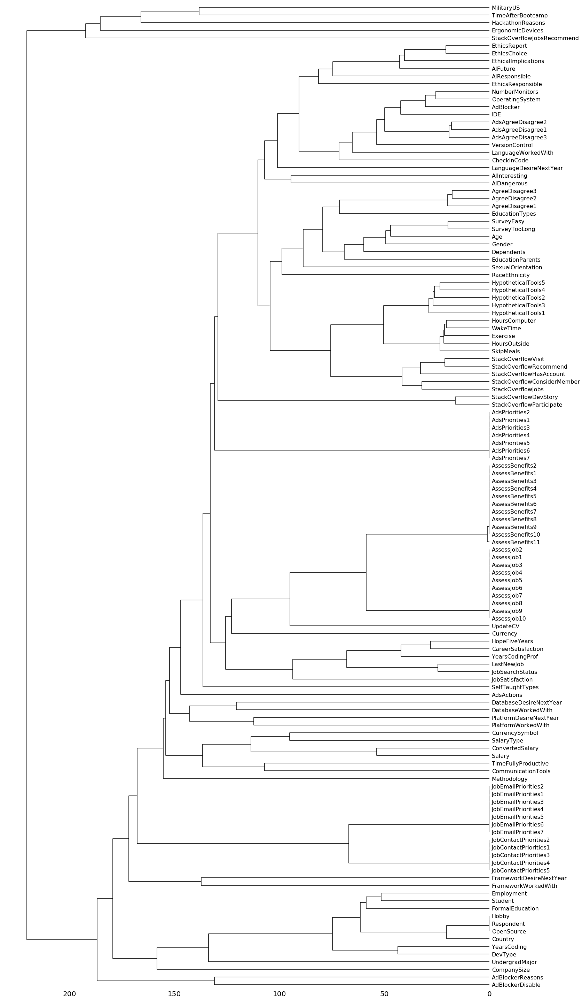

In [6]:
msno.dendrogram(public)
plt.show()

**Missing values**

In [7]:
null_values = public.isnull().sum().sort_values(ascending = False)
percentage = (public.isnull().sum().sort_values(ascending = False)/public.shape[0])*100
missing = pd.concat([null_values,percentage],axis = 1,keys = ['null_values','percentages'])
missing.head(10)

,null_values,percentages
TimeAfterBootcamp,92203,93.270952
MilitaryUS,83074,84.036215
HackathonReasons,73164,74.011431
ErgonomicDevices,64797,65.547519
AdBlockerReasons,61110,61.817814
StackOverflowJobsRecommend,60538,61.239189
JobEmailPriorities1,52642,53.251732
JobEmailPriorities2,52642,53.251732
JobEmailPriorities3,52642,53.251732
JobEmailPriorities4,52642,53.251732


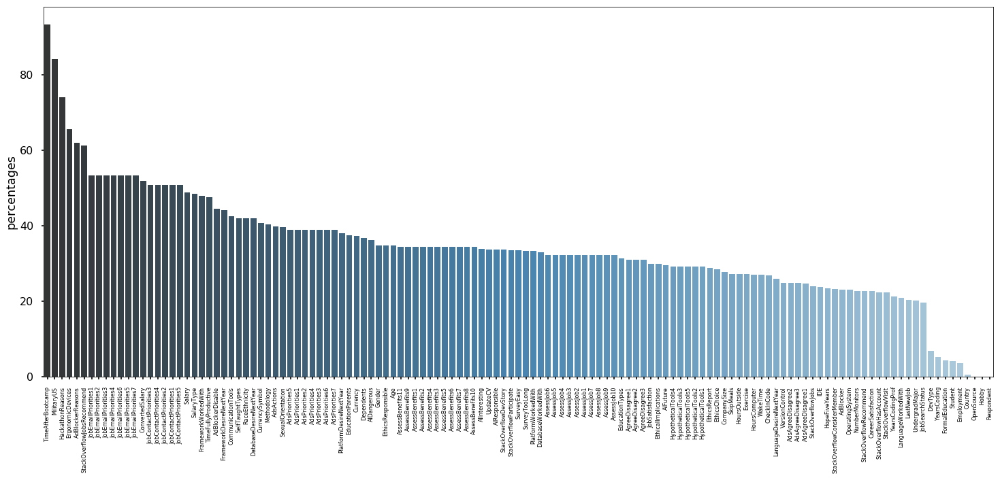

In [8]:
fig = plt.figure(figsize = (25,10))
sns.set_context("poster")
ax = sns.barplot(missing.index,missing['percentages'], palette="Blues_d")

plt.xticks(rotation = 90,fontsize=8)
plt.show()

**Respondents  by country**

In [9]:
temp = public['Country'].value_counts().head(5).sort_values(ascending=False)
values = temp.values
phases = temp.index
#values = [13873, 10553, 5443, 3703, 1708]
#phases = ['Visit', 'Sign-up', 'Selection', 'Purchase', 'Review']

# color of each funnel section
colors = ['rgb(32,155,160)', 'rgb(253,93,124)', 'rgb(28,119,139)', 'rgb(182,231,235)', 'rgb(35,154,160)']

# Shaping
n_phase = len(phases)
plot_width = 400

# height of a section and difference between sections 
section_h = 100
section_d = 10

# multiplication factor to calculate the width of other sections
unit_width = plot_width / max(values)

# width of each funnel section relative to the plot width
phase_w = [int(value * unit_width) for value in values]

# plot height based on the number of sections and the gap in between them
height = section_h * n_phase + section_d * (n_phase - 1)

# Step 3
# list containing all the plot shapes
shapes = []

# list containing the Y-axis location for each section's name and value text
label_y = []

for i in range(n_phase):
        if (i == n_phase-1):
                points = [phase_w[i] / 2, height, phase_w[i] / 2, height - section_h]
        else:
                points = [phase_w[i] / 2, height, phase_w[i+1] / 2, height - section_h]

        path = 'M {0} {1} L {2} {3} L -{2} {3} L -{0} {1} Z'.format(*points)

        shape = {
                'type': 'path',
                'path': path,
                'fillcolor': colors[i],
                'line': {
                    'width': 1,
                    'color': colors[i]
                }
        }
        shapes.append(shape)
        
        # Y-axis location for this section's details (text)
        label_y.append(height - (section_h / 2))

        height = height - (section_h + section_d)

# For phase names
label_trace = go.Scatter(
    x=[-350]*n_phase,
    y=label_y,
    mode='text',
    text=phases,
    textfont=dict(
        color='rgb(200,200,200)',
        size=15
    )
)
 
# For phase values
value_trace = go.Scatter(
    x=[350]*n_phase,
    y=label_y,
    mode='text',
    text=values,
    textfont=dict(
        color='rgb(200,200,200)',
        size=15
    )
)

data = [label_trace, value_trace]
 
layout = go.Layout(
    title="<b>Top Countries on Stack Overflow</b>",
    titlefont=dict(
        size=20,
        color='rgb(203,203,203)'
    ),
    shapes=shapes,
    height=560,
    width=800,
    showlegend=False,
    paper_bgcolor='rgba(44,58,71,1)',
    plot_bgcolor='rgba(44,58,71,1)',
    xaxis=dict(
        showticklabels=False,
        zeroline=False,
    ),
    yaxis=dict(
        showticklabels=False,
        zeroline=False
    )
)

fig = go.Figure(data=data, layout=layout)
image='png' 
from IPython.display import Image
Image('funnel_chart.png')
py.iplot(fig, filename='funnel_chart')


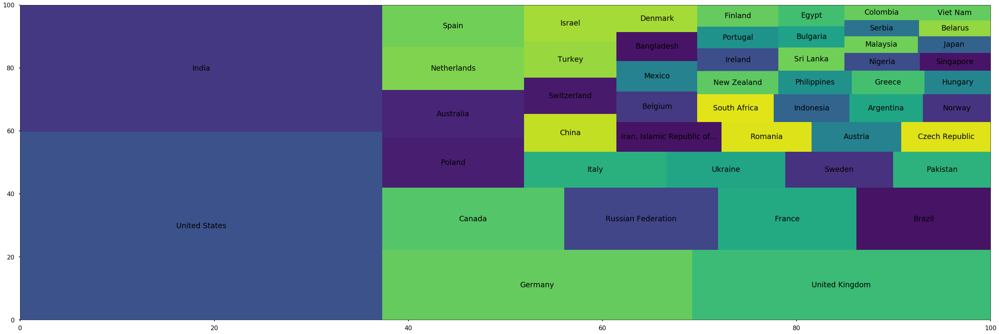

In [10]:
tree = public['Country'].value_counts().to_frame()
squarify.plot(sizes = tree['Country'].values[:50],label = tree.index[:50])
plt.rcParams.update({'font.size':6})
fig = plt.gcf()
fig.set_size_inches(45,15)
plt.savefig('area.png')
plt.show()

**Gender Split**

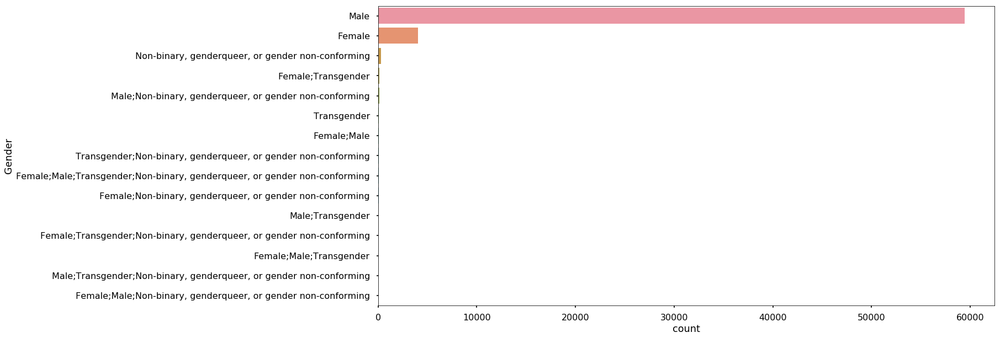

In [11]:
fig = plt.figure(figsize = (20,10))
sns.countplot(y = public['Gender'],order = public['Gender'].value_counts().index)
plt.show()

**Race  Ethnicity**

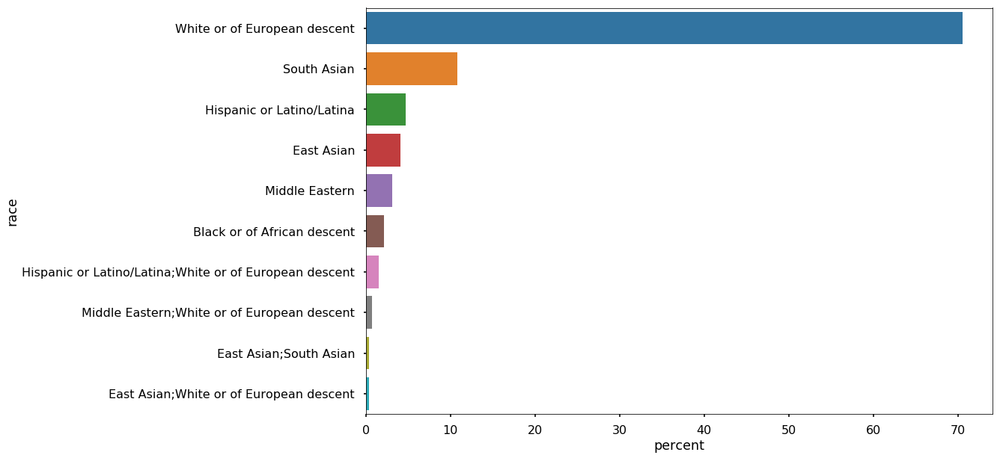

In [12]:
race = public['RaceEthnicity'].value_counts()
race = pd.DataFrame({'race':race.index,'percent':(race.values/sum(race.values))*100})
fig = plt.figure()
sns.barplot(race['percent'][:10],race['race'][:10])
plt.rcParams.update({'font.size':20})
cf = plt.gcf()
cf.set_size_inches(15,10)
plt.show()

**Students**

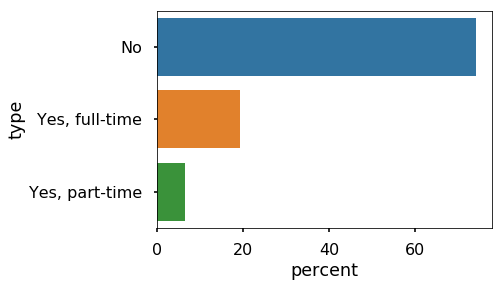

In [13]:
student = public['Student'].value_counts()
student = pd.DataFrame({'type':student.index,'percent':(student.values)*100/sum(student.values)})
fig = plt.figure()
sns.barplot(student['percent'],student['type'])
plt.show()

**Formal Education**

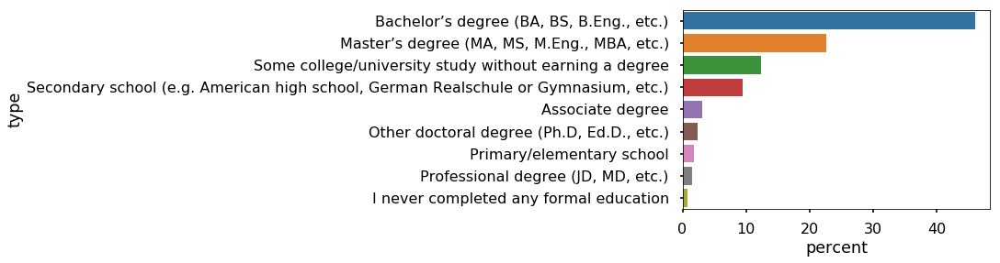

In [14]:
edu = public['FormalEducation'].value_counts()
edu = pd.DataFrame({'type':edu.index,'percent':(edu.values)*100/sum(edu.values)})
fig = plt.figure()
sns.barplot(edu['percent'],edu['type'])
plt.show()

**Employment and Education**

In [15]:
data = public[['Employment','FormalEducation']].groupby(['Employment'])
data.groups

{'Employed full-time': Int64Index([    1,     2,     3,     4,     5,     6,     7,     8,     9,
                10,
             ...
             98836, 98838, 98839, 98840, 98842, 98845, 98846, 98848, 98849,
             98852],
            dtype='int64', length=70495),
 'Employed part-time': Int64Index([    0,    16,    19,    40,    57,    60,    69,    92,    99,
               160,
             ...
             98653, 98662, 98693, 98704, 98708, 98726, 98755, 98757, 98773,
             98829],
            dtype='int64', length=5380),
 'Independent contractor, freelancer, or self-employed': Int64Index([71531, 71532, 71533, 71534, 71535, 71536, 71537, 71539, 71540,
             71541,
             ...
             98730, 98734, 98736, 98751, 98762, 98774, 98784, 98801, 98837,
             98853],
            dtype='int64', length=9282),
 'Not employed, and not looking for work': Int64Index([80450, 80452, 80457, 80460, 80461, 80462, 80470, 80471, 80474,
             80476,
        

*Employed*

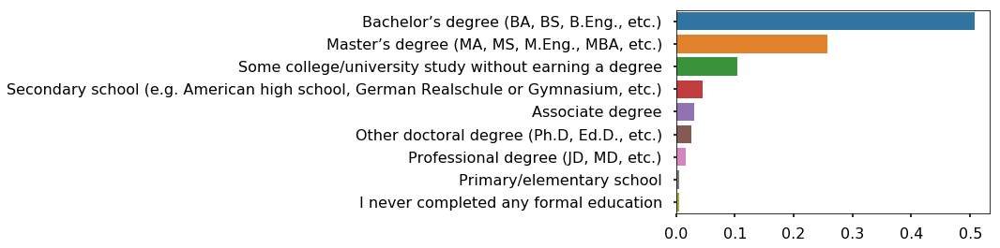

In [16]:
full_time = data.get_group('Employed full-time')
fig = plt.figure()
sns.barplot(full_time['FormalEducation'].value_counts().values/sum(full_time['FormalEducation'].value_counts().values),
            full_time['FormalEducation'].value_counts().index)
plt.show()

In [17]:
full_time['FormalEducation'].value_counts()

Bachelor’s degree (BA, BS, B.Eng., etc.)                                              35257
Master’s degree (MA, MS, M.Eng., MBA, etc.)                                           17864
Some college/university study without earning a degree                                 7280
Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)     3183
Associate degree                                                                       2120
Other doctoral degree (Ph.D, Ed.D., etc.)                                              1849
Professional degree (JD, MD, etc.)                                                     1106
Primary/elementary school                                                               358
I never completed any formal education                                                  354
Name: FormalEducation, dtype: int64

*Unemployed*

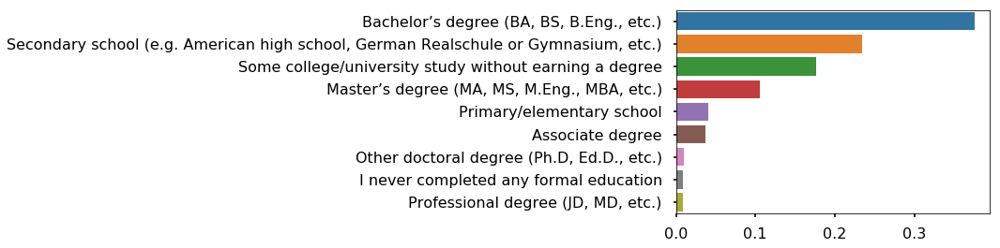

In [18]:
not_emp = data.get_group('Not employed, but looking for work')
fig = plt.figure()
sns.barplot(not_emp['FormalEducation'].value_counts().values/sum(not_emp['FormalEducation'].value_counts().values),
            not_emp['FormalEducation'].value_counts().index)
plt.show()

In [19]:
not_emp['FormalEducation'].value_counts()

Bachelor’s degree (BA, BS, B.Eng., etc.)                                              2094
Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)    1305
Some college/university study without earning a degree                                 982
Master’s degree (MA, MS, M.Eng., MBA, etc.)                                            590
Primary/elementary school                                                              229
Associate degree                                                                       207
Other doctoral degree (Ph.D, Ed.D., etc.)                                               56
I never completed any formal education                                                  51
Professional degree (JD, MD, etc.)                                                      49
Name: FormalEducation, dtype: int64

**What participants do?**

In [20]:
job = []
dev = public['DevType'].dropna()
for i in dev.index:
    job.extend([s for s in dev[i].split(';')]) 

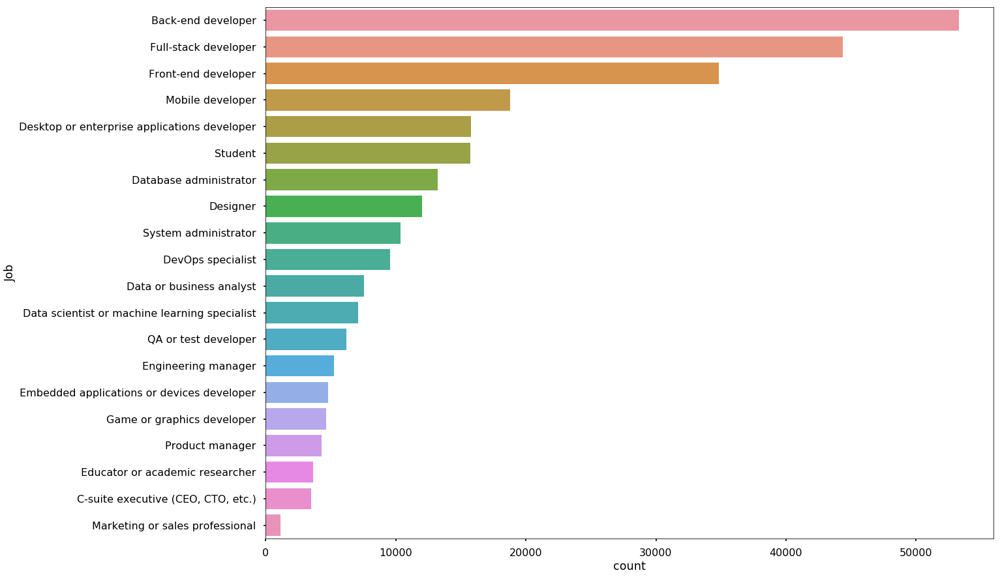

In [21]:
from collections import Counter
a = dict(Counter(job))
job_data = pd.DataFrame(list(a.items()),columns = ['Job','count'])
job_data.sort_values(by = ['count'] , ascending= False,inplace = True)

fig = plt.figure()
sns.barplot(y = job_data['Job'],x= job_data['count'])
f = plt.gcf()
f.set_size_inches((20,15))
plt.show()

**Which country opensource the most ?**

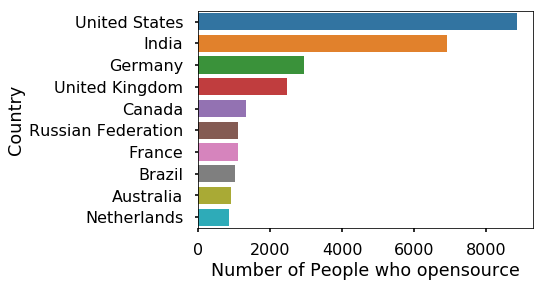

In [22]:
opensource = public.copy()
opensource = opensource.groupby(['OpenSource'])['Country'].value_counts()
fig = plt.figure()
ax = sns.barplot(x = opensource[opensource.index.levels[0][1]].values[:10],y = opensource[opensource.index.levels[0][1]].index[:10] )
ax.set(xlabel='Number of People who opensource')
plt.show()

**Countries with highest number of students**

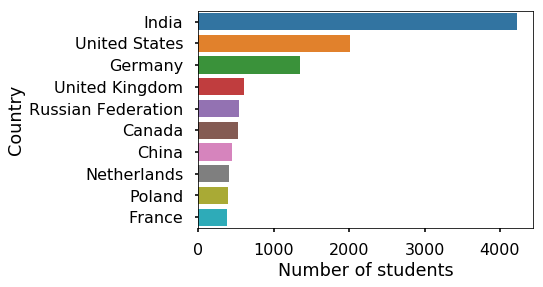

In [23]:
stu = public.copy()
stu =  stu.groupby(['Student'])['Country'].value_counts()
fig = plt.figure()
ax = sns.barplot(x = stu[stu.index.levels[0][1]].values[:10],y = stu[stu.index.levels[0][1]].index[:10] )
ax.set(xlabel='Number of students')
plt.show()

**Experience in coding and opensource**

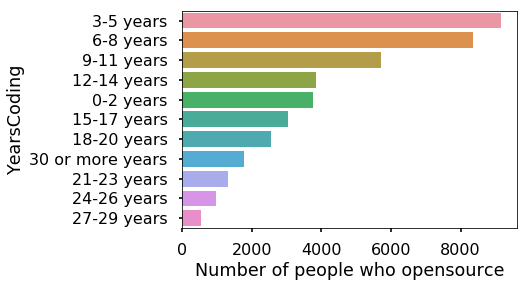

In [24]:
cod = public.copy()
cod = cod.groupby(['OpenSource'])['YearsCoding'].value_counts()

fig = plt.figure()
ax = sns.barplot(x = cod[cod.index.levels[0][1]].values,y = cod[cod.index.levels[0][1]].index)
ax.set(xlabel = 'Number of people who opensource')
plt.show()

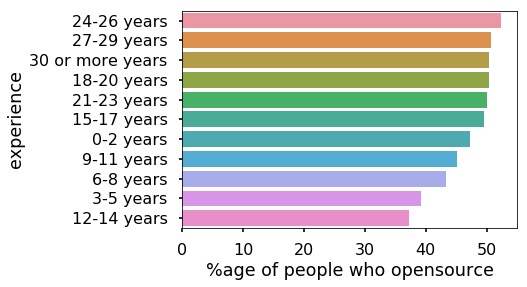

In [25]:
fig = plt.figure()
total = cod[cod.index.levels[0][1]].values + cod[cod.index.levels[0][0]].values
data = pd.DataFrame()
data['experience'] = cod[cod.index.levels[0][1]].index
data['ratio'] = (cod[cod.index.levels[0][1]].values/total)
data.sort_values(by = 'ratio',ascending = False,inplace = True)
ax = sns.barplot(x = data['ratio']*100,y =data['experience'] )
ax.set(xlabel = '%age of people who opensource')
plt.show()

**Coding as hobby**

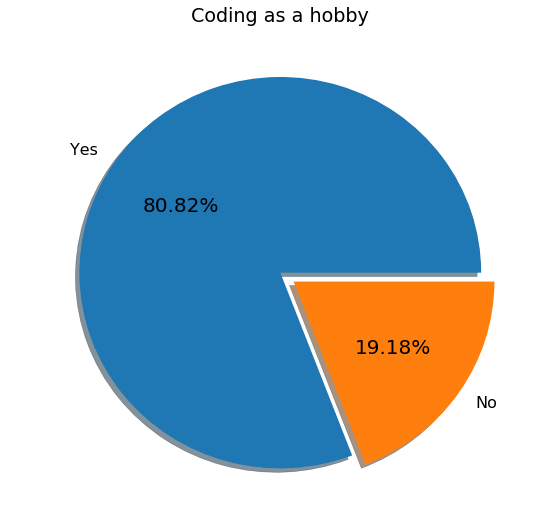

In [26]:
fig,ax = plt.subplots(1,1,figsize=(9,9))
ax = public['Hobby'].value_counts().plot.pie(autopct = '%1.2f%%',shadow = True,explode = [0,0.08])
ax.set_ylabel(' ')
plt.title("Coding as a hobby")
plt.show()

**Word Cloud**

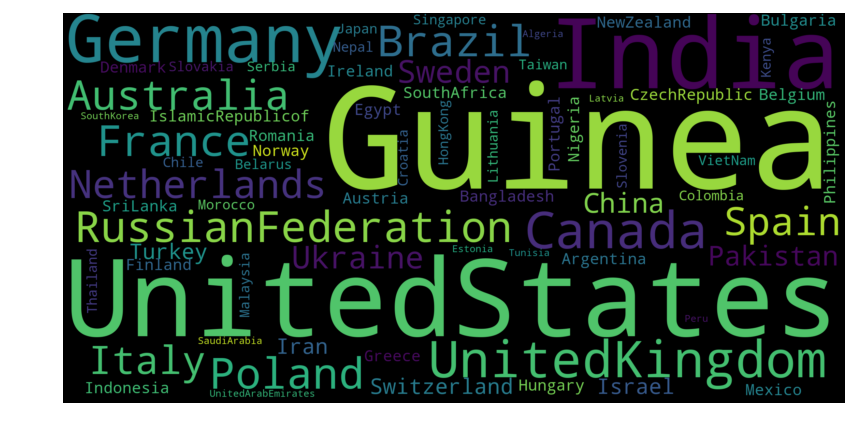

In [27]:
country = public['Country'].value_counts().reset_index()
country_ = country['index'].str.replace(" ","")
cloud = WordCloud(scale = 6).generate(" ".join(country_))
plt.figure(figsize=(14,10))
plt.imshow(cloud,interpolation="bilinear")
plt.axis('off')
plt.savefig('cloud.png')
plt.show()

**Company size**

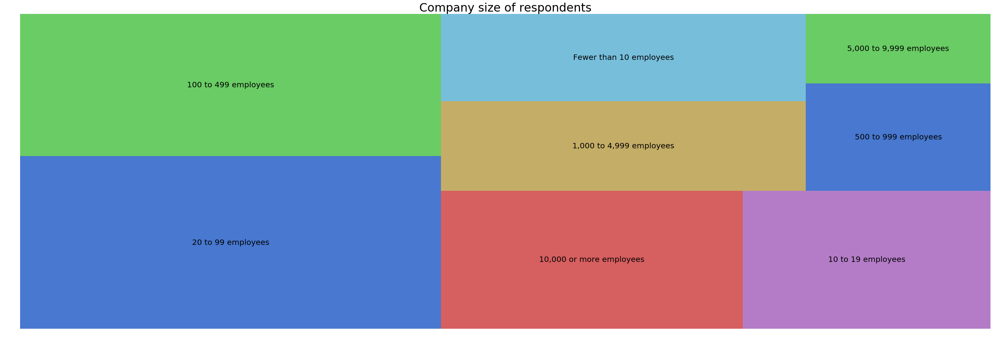

In [28]:
fig = plt.figure()

squarify.plot(sizes=public["CompanySize"].value_counts().values,label=public["CompanySize"].value_counts().keys(),color=sns.color_palette("muted"))
fig = plt.gcf()
plt.axis('off')
fig.set_size_inches(45,15)
plt.title("Company size of respondents",size = 30)
plt.show()


**Language ( LanguageWorkedWith/LanguageDesireNextYear ) **

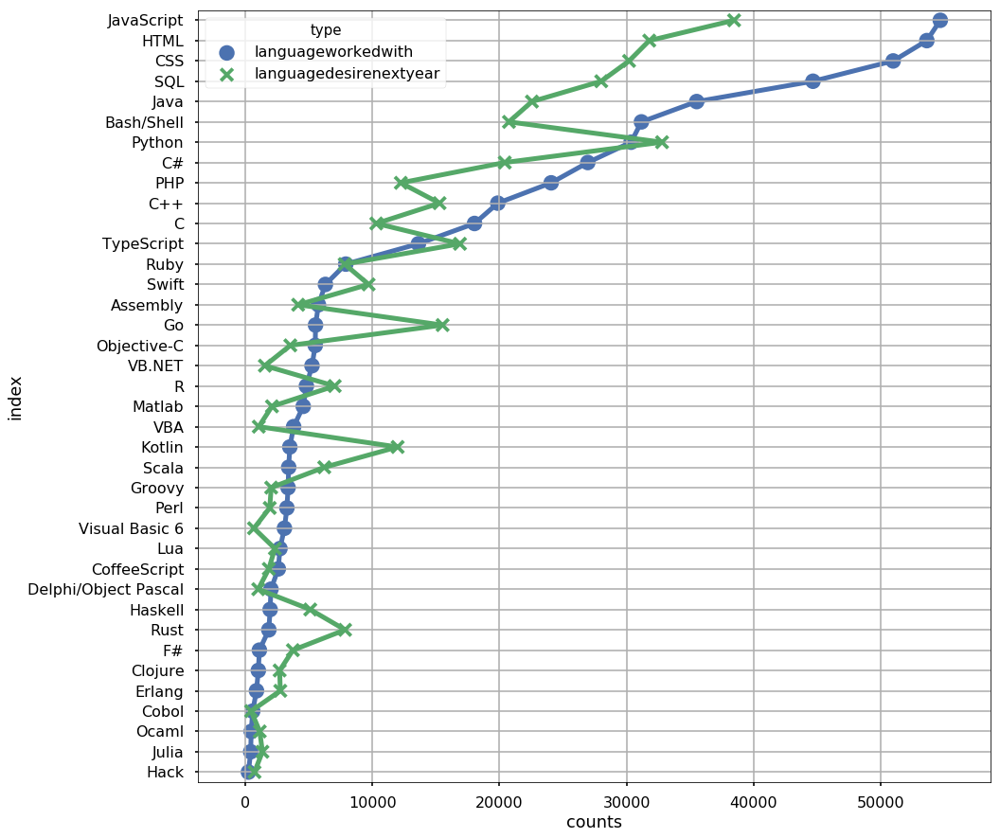

In [29]:
data1 = public['LanguageWorkedWith'].str.split(';',expand = True).stack().reset_index()[0].value_counts().reset_index()
data1['type'] = 'languageworkedwith'
data2 = public['LanguageDesireNextYear'].str.split(';',expand = True).stack().reset_index()[0].value_counts().reset_index()
data2['type']  = 'languagedesirenextyear'
data = pd.concat([data1,data2],axis = 0)

data.rename(columns = {0:'counts'},inplace = True)
sns.pointplot(y='index', x= 'counts', data =data,hue = 'type',join=True, markers=["o", "x"],palette="deep")
plt.grid(True,alpha=1)
g = plt.gcf()
g.set_size_inches(15,15)

**Who is more sincere towards health ?**

In [30]:
exer = public.groupby(['Exercise'])['Gender'].value_counts().unstack(level = 0)
exer = exer.loc[['Female','Male']]
exer.loc['Female'] = exer.loc['Female']*100/4025
exer.loc['Male'] = exer.loc['Male']*100/59458
exer.reset_index()
exer = exer.stack().to_frame()
exer.rename(columns = {0:'percentage'},inplace = True)
exer

percentage
Gender Exercise                              
Female 1 - 2 times per week         31.527950
       3 - 4 times per week         20.621118
       Daily or almost every day    13.440994
       I don't typically exercise   33.316770
Male   1 - 2 times per week         28.813616
       3 - 4 times per week         19.921625
       Daily or almost every day    13.237916
       I don't typically exercise   37.266642

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



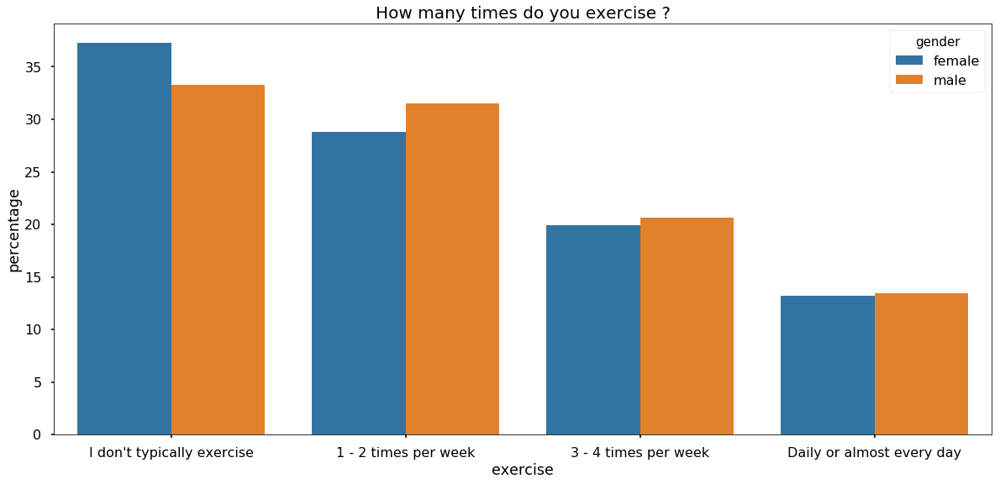

In [31]:
exer1 = pd.DataFrame()
exer1['exercise'] = list(exer.index.levels[1])*2
exer1['percent'] = exer.percentage.values
exer1['gender'] = (['male']*8)
exer1['gender'][4:] = ['female']*4
exer1.sort_values(by = 'percent', ascending = False,inplace = True)

ax = sns.barplot(x = exer1.exercise,y = exer1.percent,hue = exer1.gender)
ax.set(ylabel = 'percentage')
plt.title('How many times do you exercise ?',size= 20)
f = plt.gcf()
f.set_size_inches(20,9)

**Communication Tools**

In [32]:
tools = public['CommunicationTools'].str.split(';',expand = True).stack().reset_index()[0].value_counts().reset_index()
tools

,index,0
0,Slack,29483
1,Jira,23692
2,"Office / productivity suite (Microsoft Office, Google Suite, etc.)",22416
3,"Other wiki tool (Github, Google Sites, proprietary software, etc.)",17879
4,Confluence,16987
5,Google Hangouts/Chat,12361
6,"Other chat system (IRC, proprietary software, etc.)",12242
7,Trello,10221
8,Facebook,5671
9,HipChat,3524


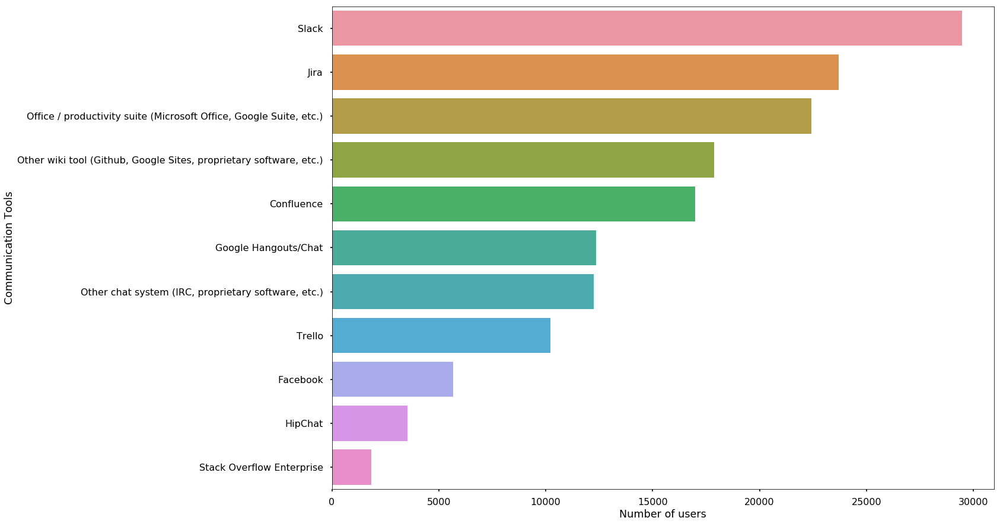

In [33]:
fig = plt.figure()
ax = sns.barplot(y = tools['index'],x = tools[0])
ax.set(xlabel = 'Number of users',ylabel = 'Communication Tools')
f = plt.gcf()
f.set_size_inches(20,15)
plt.show()

**How people learned ?**

In [34]:
types = public['SelfTaughtTypes'].str.split(';',expand = True).stack().reset_index()[0].value_counts().reset_index()
types

,index,0
0,The official documentation and/or standards for the technology,47615
1,Questions & answers on Stack Overflow,47407
2,"A book or e-book from O’Reilly, Apress, or a similar publisher",28780
3,"Online developer communities other than Stack Overflow (ex. forums, listservs, IRC channels, etc.)",28734
4,The technology’s online help system,27562
5,A college/university computer science or software engineering book,11325
6,"Tapping your network of friends, family, and peers versed in the technology",11120
7,"Internal Wikis, chat rooms, or documentation set up by my company for employees",9497
8,Pre-scheduled tutoring or mentoring sessions with a friend or colleague,2373


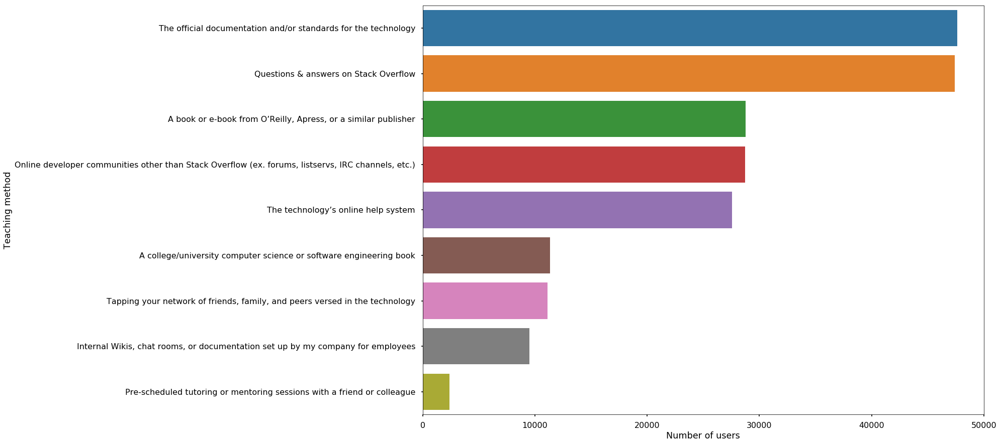

In [35]:
fig = plt.figure()
ax = sns.barplot(x = types[0],y=types['index'])
f = plt.gcf()
f.set_size_inches(20,15)
ax.set(xlabel = 'Number of users',ylabel = 'Teaching method')
plt.show()

**About Stack Overflow**

>  **Do you have stackoverflow account?**

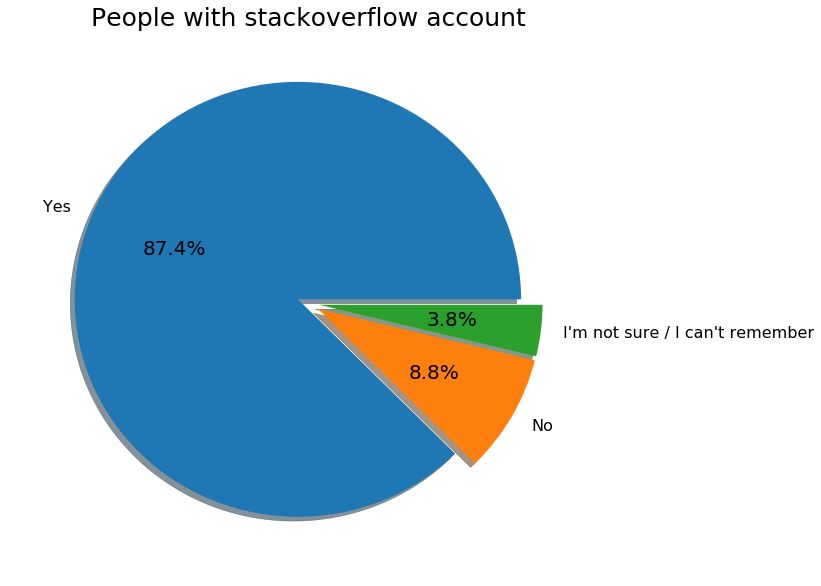

In [36]:
fig = plt.figure()
ax = public['StackOverflowHasAccount'].dropna().value_counts().plot.pie(autopct = '%1.1f%%',shadow = True,explode = [0.05,0.05,0.05])
ax.set(ylabel = ' ')
f = plt.gcf()
f.set_size_inches(10,10)
plt.title('People with stackoverflow account',size = 25)
plt.show()

> 

> **How frequently do you visit stackoverflow?**

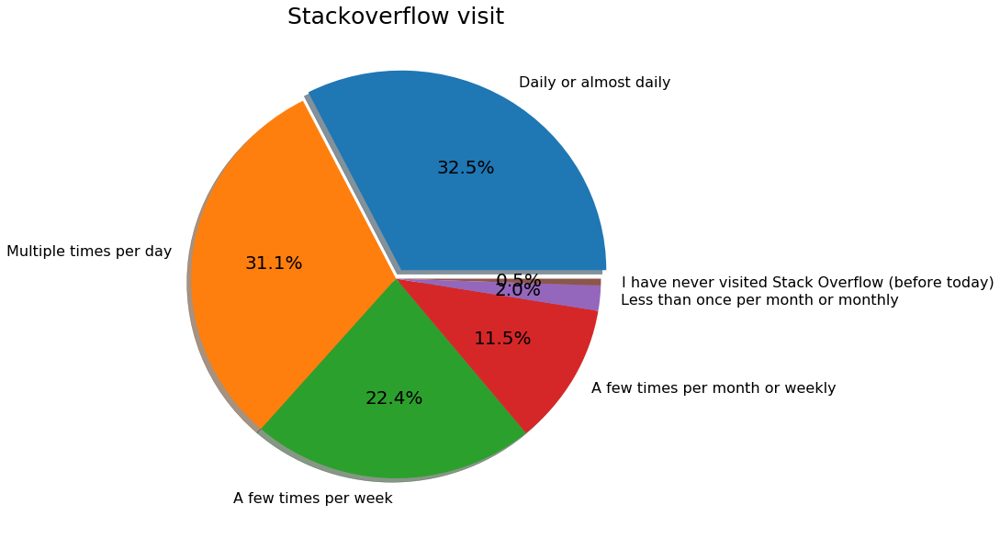

In [37]:
fig = plt.figure()
ax = public['StackOverflowVisit'].value_counts().plot.pie(autopct = '%1.1f%%',shadow = True,explode = [0.05,0.0,0.0,0.0,0,0])
f =  plt.gcf()
f.set_size_inches(10,10)
plt.title('Stackoverflow visit',size = 25)
ax.set(ylabel = ' ')
plt.show()

> **How frequently would you say you participate in Q&A on Stack Overflow?**

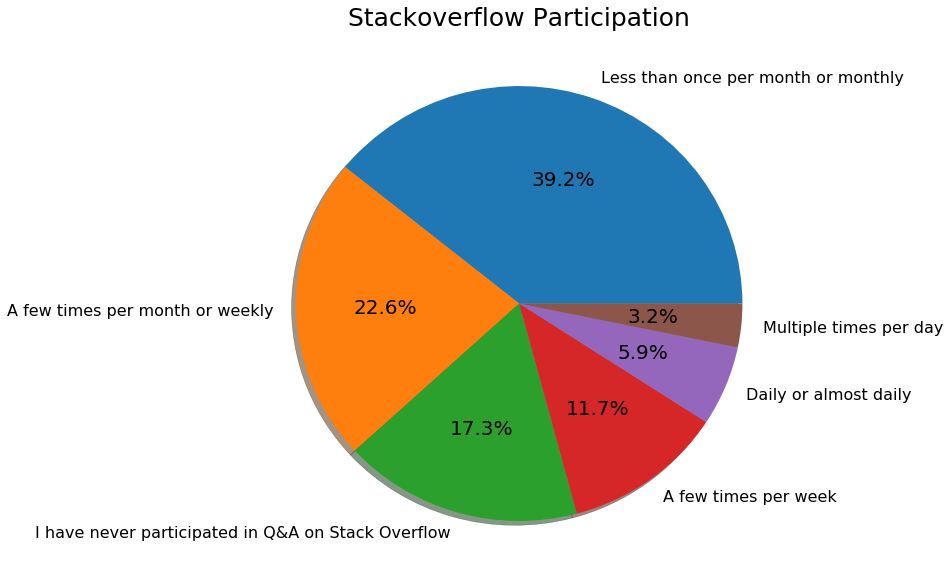

In [38]:
fig = plt.figure()
ax = public['StackOverflowParticipate'].value_counts().plot.pie(autopct = '%1.1f%%',shadow = True)
f =  plt.gcf()
f.set_size_inches(10,10)
plt.title('Stackoverflow Participation',size = 25)
ax.set(ylabel = ' ')
plt.show()

> ****

**Thanks for going through the notebook.  :)**
